# Utiliy Analysis

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt

color_pal = sns.color_palette()

In [2]:
df = pd.read_excel("datasets/datasetv1.xlsx")
df = df.rename(columns={'index': 'houseid-meterid', 'reading': 'quantity'})
# df.drop('Unnamed: 0', axis=1, inplace=True)
df.head()

,id,paymenttermid,houseid,houseid-meterid,quantity,month,year
0,1,37,241,241M990,753.56,2,2019
1,2,7,1,1M256,103.00,2,2019
2,3,7,5,5M260,103.00,2,2019
3,4,7,9,9M264,103.00,2,2019
4,5,7,13,13M268,107.00,2,2019


## Data Cleaning

In [3]:
mapping = {
        37: "electricity", 
        11:"backuppower", 
        36:"water", 
        7: "gas"}
df['paymenttermid'] = df['paymenttermid'].map(mapping)
df["Datetime"] = df["year"].astype(str) + '-' + df["month"].astype(str)
df["Datetime"] = pd.to_datetime(df["Datetime"])  
df.sort_index(inplace=True)

In [4]:
df.head()

,id,paymenttermid,houseid,houseid-meterid,quantity,month,year,Datetime
0,1,electricity,241,241M990,753.56,2,2019,2019-02-01
1,2,gas,1,1M256,103.00,2,2019,2019-02-01
2,3,gas,5,5M260,103.00,2,2019,2019-02-01
3,4,gas,9,9M264,103.00,2,2019,2019-02-01
4,5,gas,13,13M268,107.00,2,2019,2019-02-01


Removing data from January 2019

In [5]:
df = df[df["Datetime"] > "2019-01-01"]
df.sort_values("Datetime")
df.head(5)

,id,paymenttermid,houseid,houseid-meterid,quantity,month,year,Datetime
0,1,electricity,241,241M990,753.56,2,2019,2019-02-01
1,2,gas,1,1M256,103.00,2,2019,2019-02-01
2,3,gas,5,5M260,103.00,2,2019,2019-02-01
3,4,gas,9,9M264,103.00,2,2019,2019-02-01
4,5,gas,13,13M268,107.00,2,2019,2019-02-01


In [6]:
house_meter = df[(df["year"] == 2019) & (df["month"] == 2)]["houseid-meterid"].unique()

In [7]:
len(house_meter)

1003

In [8]:
filtered_df = df.query("`houseid-meterid` in @house_meter")

In [9]:
print(f"Filtering the dataset to only include housed that participate from the first month reduces the dataset to {filtered_df.shape[0]} rows.")

Filtering the dataset to only include housed that participate from the first month reduces the dataset to 46738 rows.


#### Split the main dataset based on utility

In [10]:
df.paymenttermid.unique()

array(['electricity', 'gas', 'water', 'backuppower'], dtype=object)

In [11]:
water_df = filtered_df.query("paymenttermid == 'water'")
electricity_df = filtered_df.query("paymenttermid == 'electricity'")
backuppower_df = filtered_df.query("paymenttermid == 'backuppower'")
gas_df = filtered_df.query("paymenttermid == 'gas'")

print(f"Water rows {water_df.shape[0]}")
print(f"Electricity rows {electricity_df.shape[0]}")
print(f"Backup Power rows {backuppower_df.shape[0]}")
print(f"Gas rows {gas_df.shape[0]}")

Water rows 11474
Electricity rows 11807
Backup Power rows 11600
Gas rows 11857


#### Identifying and removing repeated readings

Which houses have more than one meter reading?

In [12]:
water_grouped_data = water_df.groupby(["year", "month", "houseid-meterid",])

def filter_func(x):
    return len(x) > 1

repeat_water_records = water_grouped_data.filter(filter_func)
print(f"There are {repeat_water_records.shape[0]} repeated water readings") 

There are 40 repeated water readings


In [13]:
gas_grouped_data = gas_df.groupby(["year", "month", "houseid-meterid",])

def filter_func(x):
    return len(x) > 1

repeat_gas_records = gas_grouped_data.filter(filter_func)
print(f"There are {repeat_gas_records.shape[0]} repeated gas readings") 

There are 40 repeated gas readings


In [14]:
electricity_grouped_data = electricity_df.groupby(["year", "month", "houseid-meterid",])

def filter_func(x):
    return len(x) > 1

repeat_electricity_records = electricity_grouped_data.filter(filter_func)
print(f"There are {repeat_electricity_records.shape[0]} repeated electricity readings") 

There are 34 repeated electricity readings


In [15]:
backuppower_grouped_data = backuppower_df.groupby(["year", "month", "houseid-meterid",])

def filter_func(x):
    return len(x) > 1

repeat_backuppower_records = backuppower_grouped_data.filter(filter_func)
print(f"There are {repeat_backuppower_records.shape[0]} repeated backuppower readings") 

There are 35 repeated backuppower readings


In [16]:
def true_reading(x):
    if len(x) > 1:
        return x.max()
    else:
        return x
    

In [17]:
# test_df = water_df.groupby(["year", "month", "houseid-meterid"])
# t_df = water_df.query('year == 2019 & month == 1')
# t_df.head()

In [18]:
# water_data.head()

In [19]:
#Water
water_data = water_df.groupby(["Datetime", "houseid-meterid"])
water_df["cleaned_quantity"] = water_data["quantity"].transform(true_reading)


# Gas 
gas_data = gas_df.groupby(["Datetime", "houseid-meterid"])
gas_df["cleaned_quantity"] = gas_data["quantity"].transform(true_reading)

# Backup Power
backuppower_data = backuppower_df.groupby(["Datetime", "houseid-meterid"])
backuppower_df["cleaned_quantity"] = backuppower_data["quantity"].transform(true_reading)
# water_df = water_df[water_df["reading"] == water_df["cleaned_readings"]]

# Electricity
electricity_data = electricity_df.groupby(["Datetime", "houseid-meterid"])
electricity_df["cleaned_quantity"] = electricity_data["quantity"].transform(true_reading)
# water_df = water_df[water_df["reading"] == water_df["cleaned_readings"]]

In [20]:
water_df = water_df.drop_duplicates(["Datetime", "houseid-meterid"])
print(f"Water dataset has {water_df.shape[0]} rows")

backuppower_df = backuppower_df.drop_duplicates(["Datetime", "houseid-meterid"])
print(f"Backup power dataset has {backuppower_df.shape[0]} rows")

gas_df = gas_df.drop_duplicates(["Datetime", "houseid-meterid"])
print(f"Gas dataset has {gas_df.shape[0]} rows")

electricity_df = electricity_df.drop_duplicates(["Datetime", "houseid-meterid"])
print(f"Electricity dataset has {electricity_df.shape[0]} rows")

Water dataset has 11454 rows
Backup power dataset has 11582 rows
Gas dataset has 11837 rows
Electricity dataset has 11790 rows


In [21]:
water_df['cleaned_quantity'] = water_df['cleaned_quantity'].clip(lower=0)
backuppower_df['cleaned_quantity'] = backuppower_df['cleaned_quantity'].clip(lower=0)
gas_df['cleaned_quantity'] = gas_df['cleaned_quantity'].clip(lower=0)
electricity_df['cleaned_quantity'] = electricity_df['cleaned_quantity'].clip(lower=0)

#### Water

* Consumption Column

In [22]:
water_df["consumption"] = (water_df.sort_values('Datetime')
                           .groupby(['houseid-meterid'])["cleaned_quantity"]
                           .transform(lambda x: x.diff().shift(0)))


In [23]:
water_df["consumption"] = water_df["consumption"].fillna(0)
water_df['consumption'] = water_df['consumption'].clip(lower=0)

In [24]:
water_df.tail(5)

,id,paymenttermid,houseid,houseid-meterid,quantity,month,year,Datetime,cleaned_quantity,consumption
46802,46803,water,236,236M222,280.0,12,2022,2022-12-01,280.0,15.0
46803,46804,water,224,224M210,369.0,12,2022,2022-12-01,369.0,1.0
46804,46805,water,220,220M206,131.0,12,2022,2022-12-01,131.0,2.0
46805,46806,water,216,216M202,200.0,12,2022,2022-12-01,200.0,20.0
46806,46807,water,212,212M198,228.0,12,2022,2022-12-01,228.0,19.0


In [25]:
# water_df.tail(5)

In [26]:
# calculating the ratios

# def consumption_ratio(row): 
#     c_consumption = row["consumption"].iloc[0]
#     month = row["month"].iloc[0]
#     year = row["year"].iloc[0]
#     house = row["houseid-meterid"].iloc[0]

#     if month == 2 and year == 2019: 
#         return 0
#     else: 
#         if month == 1:
#             # print(f"This is the {month} month")
#             prevyear = year - 1
#             prevmonth = 12
#             prev_record = water_df.query("`houseid-meterid` == @house and year == @prevyear and month == @prevmonth")
#             try:
#                 ratio = c_consumption / prev_record["consumption"]
#             except ZeroDivisionError:
#                 ratio = 0
#             # print(f"Non regular rations {ratio}")
#             return ratio
#         else: 
#             prevmonth  = month - 1
#             prev_record = water_df.query("`houseid-meterid` == @house and year == @year and month == @prevmonth")
#             # print(prev_record)
#             try:
#                 ratio = c_consumption/ prev_record["consumption"]
#             except ZeroDivisionError:
#                 ratio = 0
#             # ratio = c_consumption / prev_record["consumption"]
#             # print(f"Regular ratios {ratio}")
#             return ratio



* Consumption Ratio

In [27]:
# water_df["consumption_ratio"] = water_df.groupby(['Datetime', 'houseid-meterid']).apply(consumption_ratio)

# step1 shift create new column called previous column
cons_ratio_df = water_df.sort_values(by=['Datetime'])
cons_ratio_df["prev-month-consumption"] = water_df.groupby(['houseid-meterid'])["consumption"].transform(lambda x: x.shift(1))
cons_ratio_df["prev-month-consumption"] = cons_ratio_df["prev-month-consumption"].fillna(0)
cons_ratio_df["consumption-ratio"] = (cons_ratio_df["consumption"] / cons_ratio_df["prev-month-consumption"]) * 100
cons_ratio_df.replace([np.inf, -np.inf], 0, inplace=True)
cons_ratio_df["consumption-ratio"].fillna(0, inplace=True)
water_df = cons_ratio_df
water_df.tail(5)

,id,paymenttermid,houseid,houseid-meterid,quantity,month,year,Datetime,cleaned_quantity,consumption,prev-month-consumption,consumption-ratio
46531,46532,water,114,114M108,9.0,12,2022,2022-12-01,9.0,1.0,0.0,0.000000
46532,46533,water,110,110M104,45.0,12,2022,2022-12-01,45.0,1.0,0.0,0.000000
46533,46534,water,106,106M100,254.0,12,2022,2022-12-01,254.0,5.0,5.0,100.000000
46535,46536,water,98,98M92,303.0,12,2022,2022-12-01,303.0,15.0,13.0,115.384615
46806,46807,water,212,212M198,228.0,12,2022,2022-12-01,228.0,19.0,13.0,146.153846


#### Gas

* Consumption

In [28]:
gas_df["consumption"] = (gas_df.sort_values('Datetime')
                           .groupby(['houseid-meterid'])["cleaned_quantity"]
                           .transform(lambda x: x.diff().shift(0)))
gas_df["consumption"] = gas_df["consumption"].fillna(0)
gas_df['consumption'] = gas_df['consumption'].clip(lower=0)

* Consumption-Ratio

In [29]:
# step1 shift create new column called previous column
cons_ratio_df = gas_df.sort_values(by=['Datetime'])
cons_ratio_df["prev-month-consumption"] = gas_df.groupby(['houseid-meterid'])["consumption"].transform(lambda x: x.shift(1))
cons_ratio_df["prev-month-consumption"] = cons_ratio_df["prev-month-consumption"].fillna(0)
cons_ratio_df["consumption-ratio"] = (cons_ratio_df["consumption"] / cons_ratio_df["prev-month-consumption"]) * 100
cons_ratio_df.replace([np.inf, -np.inf], 0, inplace=True)
cons_ratio_df["consumption-ratio"].fillna(0, inplace=True)
gas_df = cons_ratio_df
gas_df.tail(5)

,id,paymenttermid,houseid,houseid-meterid,quantity,month,year,Datetime,cleaned_quantity,consumption,prev-month-consumption,consumption-ratio
46498,46499,gas,116,116M365,4585.0,12,2022,2022-12-01,4585.0,434.0,807.0,53.779430
46499,46500,gas,100,100M349,133102.0,12,2022,2022-12-01,133102.0,2774.0,2156.0,128.664193
46500,46501,gas,96,96M345,9671.0,12,2022,2022-12-01,9671.0,4785.0,1204.0,397.425249
46487,46488,gas,70,70M321,93489.0,12,2022,2022-12-01,93489.0,4708.0,5695.0,82.669008
47331,47332,gas,132,132M379,85.0,12,2022,2022-12-01,85.0,0.0,0.0,0.000000


#### Electricity

* Consumption

In [30]:
electricity_df["consumption"] = (electricity_df.sort_values('Datetime')
                           .groupby(['houseid-meterid'])["cleaned_quantity"]
                           .transform(lambda x: x.diff().shift(0)))
electricity_df["consumption"] = electricity_df["consumption"].fillna(0)
electricity_df['consumption'] = electricity_df['consumption'].clip(lower=0)

In [31]:
# step1 shift create new column called previous column
cons_ratio_df = electricity_df.sort_values(by=['Datetime'])
cons_ratio_df["prev-month-consumption"] = electricity_df.groupby(['houseid-meterid'])["consumption"].transform(lambda x: x.shift(1))
cons_ratio_df["prev-month-consumption"] = cons_ratio_df["prev-month-consumption"].fillna(0)
cons_ratio_df["consumption-ratio"] = (cons_ratio_df["consumption"] / cons_ratio_df["prev-month-consumption"]) * 100
cons_ratio_df.replace([np.inf, -np.inf], 0, inplace=True)
cons_ratio_df["consumption-ratio"].fillna(0, inplace=True)
electricity_df = cons_ratio_df
electricity_df.tail(5)

,id,paymenttermid,houseid,houseid-meterid,quantity,month,year,Datetime,cleaned_quantity,consumption,prev-month-consumption,consumption-ratio
46909,46910,electricity,106,106M865,4065.50,12,2022,2022-12-01,4065.50,74.37,89.08,83.486753
46910,46911,electricity,105,105M864,2367.86,12,2022,2022-12-01,2367.86,30.99,50.01,61.967606
46911,46912,electricity,104,104M863,3848.64,12,2022,2022-12-01,3848.64,100.56,118.65,84.753477
46898,46899,electricity,83,83M844,3022.01,12,2022,2022-12-01,3022.01,96.32,90.83,106.044259
47071,47072,electricity,249,249M998,12123.65,12,2022,2022-12-01,12123.65,285.85,259.61,110.107469


#### BackupPower 

* Consumption

In [32]:
backuppower_df["consumption"] = (backuppower_df.sort_values('Datetime')
                           .groupby(['houseid-meterid'])["cleaned_quantity"]
                           .transform(lambda x: x.diff().shift(0)))
backuppower_df["consumption"] = backuppower_df["consumption"].fillna(0)
backuppower_df['consumption'] = backuppower_df['consumption'].clip(lower=0)

In [33]:
# step1 shift create new column called previous column
cons_ratio_df = backuppower_df.sort_values(by=['Datetime'])
cons_ratio_df["prev-month-consumption"] = backuppower_df.groupby(['houseid-meterid'])["consumption"].transform(lambda x: x.shift(1))
cons_ratio_df["prev-month-consumption"] = cons_ratio_df["prev-month-consumption"].fillna(0)
cons_ratio_df["consumption-ratio"] = (cons_ratio_df["consumption"] / cons_ratio_df["prev-month-consumption"]) * 100
cons_ratio_df.replace([np.inf, -np.inf], 0, inplace=True)
cons_ratio_df["consumption-ratio"].fillna(0, inplace=True)
backuppower_df = cons_ratio_df
backuppower_df.tail(5)

,id,paymenttermid,houseid,houseid-meterid,quantity,month,year,Datetime,cleaned_quantity,consumption,prev-month-consumption,consumption-ratio
47160,47161,backuppower,95,95M599,39.75,12,2022,2022-12-01,39.75,0.07,0.72,9.722222
47161,47162,backuppower,94,94M598,60.76,12,2022,2022-12-01,60.76,0.74,1.69,43.786982
47162,47163,backuppower,93,93M597,36.71,12,2022,2022-12-01,36.71,0.49,1.88,26.063830
47149,47150,backuppower,84,84M590,57.22,12,2022,2022-12-01,57.22,0.41,0.42,97.619048
47323,47324,backuppower,268,268M762,102.91,12,2022,2022-12-01,102.91,0.40,1.47,27.210884


## Data Exploration
#### Water

In [34]:
water_df.set_index("Datetime", inplace=True)

##### Readings

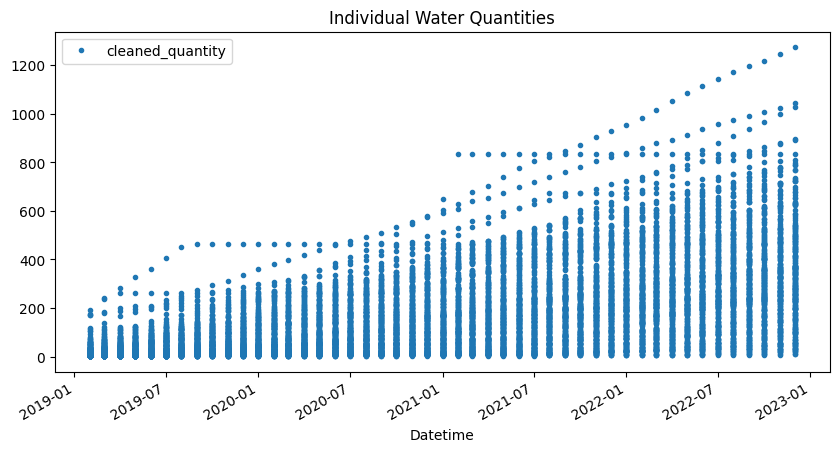

In [35]:
water_df.plot(
    y='cleaned_quantity',
    style='.',
        figsize=(10, 5),
        color=color_pal[0],
        title='Individual Water Quantities')
plt.show()

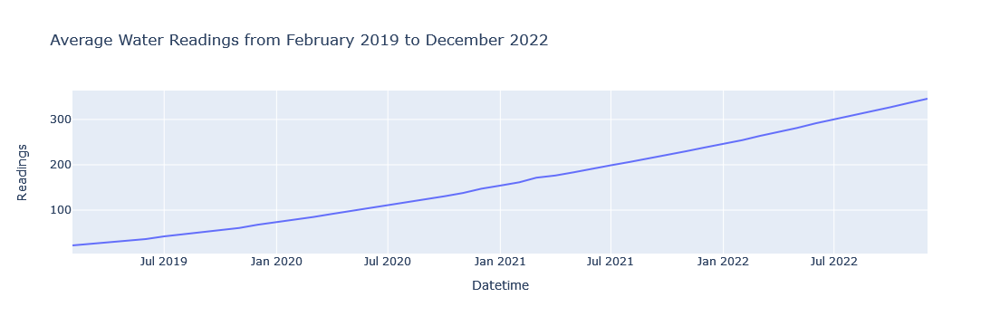

In [36]:
mean_water = water_df.groupby(water_df.index)["cleaned_quantity"].mean()
fig = px.line(
    mean_water, 
    x=mean_water.index, 
    y="cleaned_quantity", 
    title="Average Water Readings from February 2019 to December 2022",
    labels={
        "cleaned_quantity": "Readings"
    }
)
fig.show()
                 

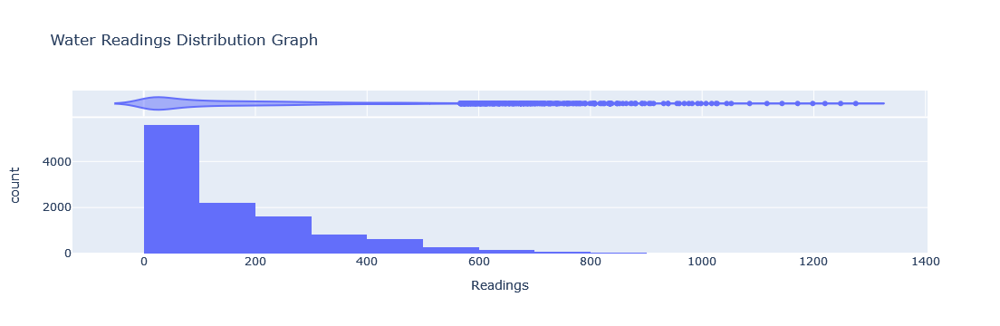

In [37]:
fig = px.histogram(water_df, 
                   x="cleaned_quantity", 
                   marginal="violin", 
                   nbins=20, 
                   hover_data=["year", "houseid-meterid"],
                   title="Water Readings Distribution Graph",
                   labels={
                       "cleaned_quantity": "Readings"
                   }
                  )
fig.show()

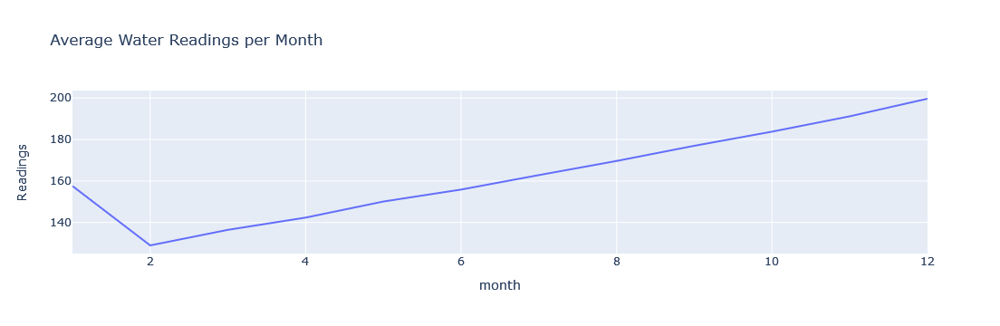

In [38]:
p_table = pd.pivot_table(water_df, values="cleaned_quantity", index="month", aggfunc="mean")
fig = px.line(
    p_table, 
    x=p_table.index, 
    y="cleaned_quantity", 
    title="Average Water Readings per Month", 
    labels={
        "cleaned_quantity": "Readings"
    }
)
fig.show()

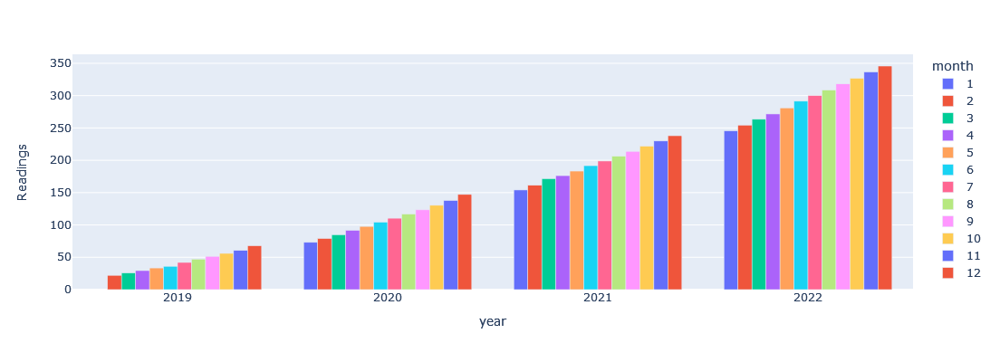

In [39]:
p_table_2 = pd.pivot_table(water_df, values="cleaned_quantity", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='cleaned_quantity')
fig = px.bar(melted_df, 
             x='year', 
             y='cleaned_quantity', 
             color='month', 
             barmode="group",
             labels={
                 "cleaned_quantity": "Readings" 
             },
             height=400
            )
fig.show()

In [40]:
# 2019 
consumption_value_1 = melted_df.query("month == 2 and year == 2019")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2019")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2019 Water readings in January - {den} and for December - {num}, readings increased by {abs((den-num))/den * 100} % ")

#2020
consumption_value_1 = melted_df.query("month == 2 and year == 2020")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2020")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2020 Water readings in January - {den} and for December - {num}, readings increased by {abs((den-num))/den * 100} % ")

# 2021
consumption_value_1 = melted_df.query("month == 2 and year == 2021")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2021")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2021 Water readings in January - {den} and for December - {num}, readings increased by {abs((den-num))/den * 100} % ")

#2022
consumption_value_1 = melted_df.query("month == 2 and year == 2022")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2022")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2022 Water readings in January - {den} and for December - {num}, readings increased by {abs((den-num))/den * 100} % ")

For the year 2019 Water readings in January - 22 and for December - 67, readings increased by 204.54545454545453 % 
For the year 2020 Water readings in January - 78 and for December - 147, readings increased by 88.46153846153845 % 
For the year 2021 Water readings in January - 161 and for December - 238, readings increased by 47.82608695652174 % 
For the year 2022 Water readings in January - 254 and for December - 345, readings increased by 35.826771653543304 % 


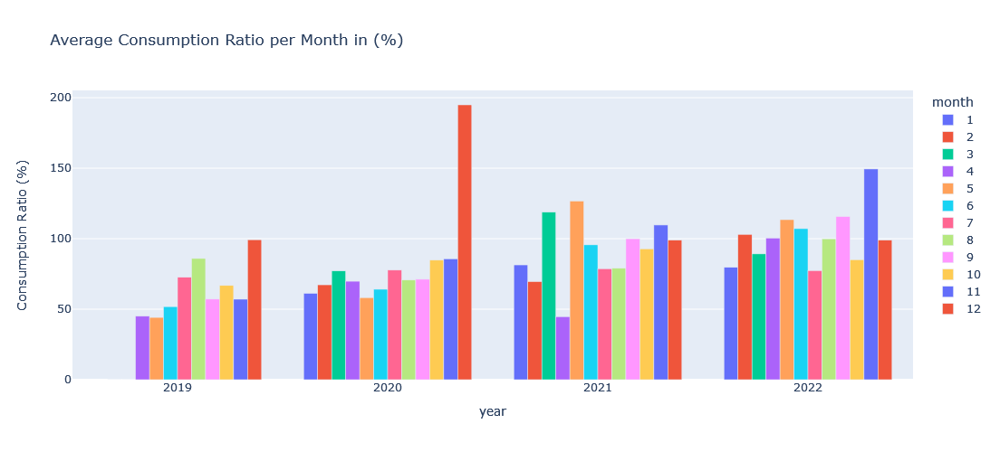

In [41]:
p_table_2 = pd.pivot_table(water_df, values="consumption-ratio", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='consumption-ratio')
fig = px.bar(melted_df, x='year', 
             y='consumption-ratio', 
             color='month', 
             barmode="group", 
             title="Average Consumption Ratio per Month in (%)", 
             labels={
                 "consumption-ratio": "Consumption Ratio (%)",
             },
             height=500
            )
fig.show()

##### Consumption

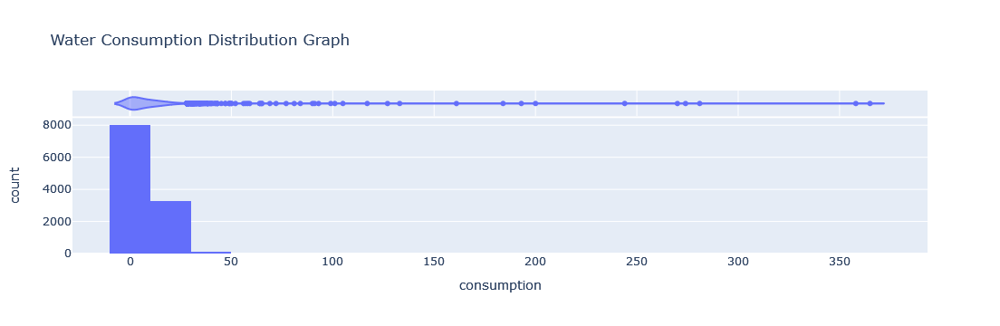

In [42]:
fig = px.histogram(water_df, 
                   x="consumption", 
                   marginal="violin", 
                   nbins=20, 
                   hover_data=["year", "houseid-meterid"],
                   title="Water Consumption Distribution Graph"
                  )
fig.show()

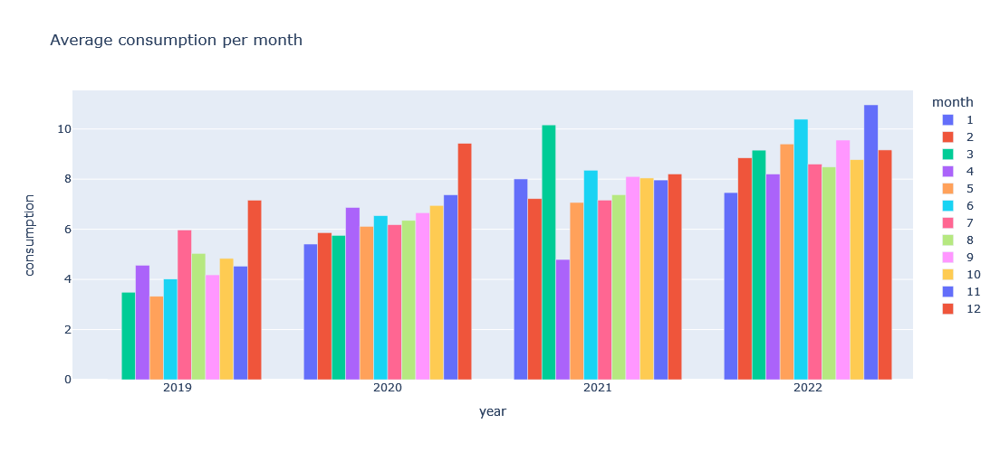

In [43]:
p_table_2 = pd.pivot_table(water_df, values="consumption", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='consumption')
fig = px.bar(
    melted_df, x='year', y='consumption', 
    color='month', 
    barmode="group", 
    title="Average consumption per month",
    height=500,
)
fig.show()

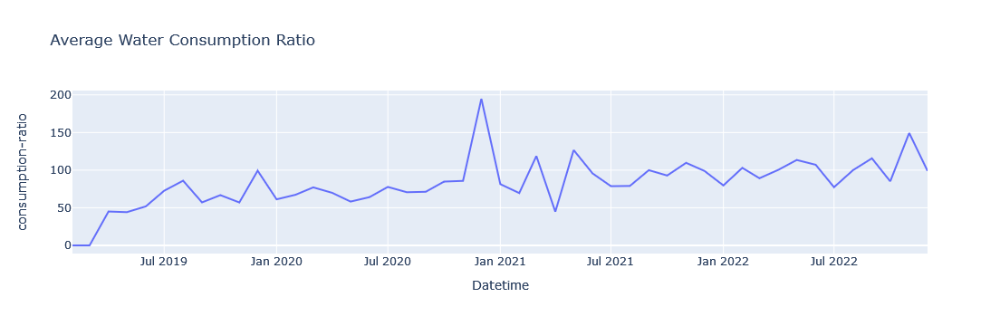

In [44]:
mean_water = water_df.groupby(water_df.index)["consumption-ratio"].mean()
fig = px.line(
    mean_water, 
    x=mean_water.index, 
    y="consumption-ratio", 
    title="Average Water Consumption Ratio", 
    labels={
        "cleaned_quantity": "Readings"
    }
)
fig.show()

#### Gas

##### Readings

In [45]:
gas_df.set_index("Datetime", inplace=True)

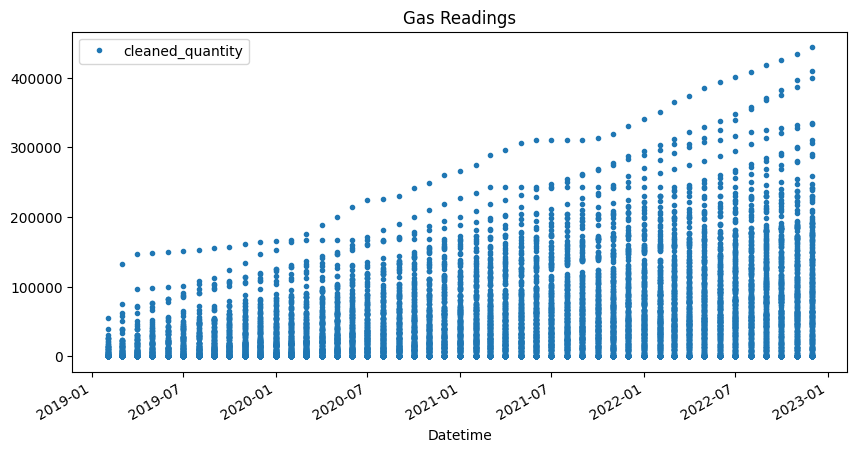

In [46]:
gas_df.plot(
    y='cleaned_quantity',
    style='.',
        figsize=(10, 5),
        color=color_pal[0],
        title='Gas Readings')
plt.show()

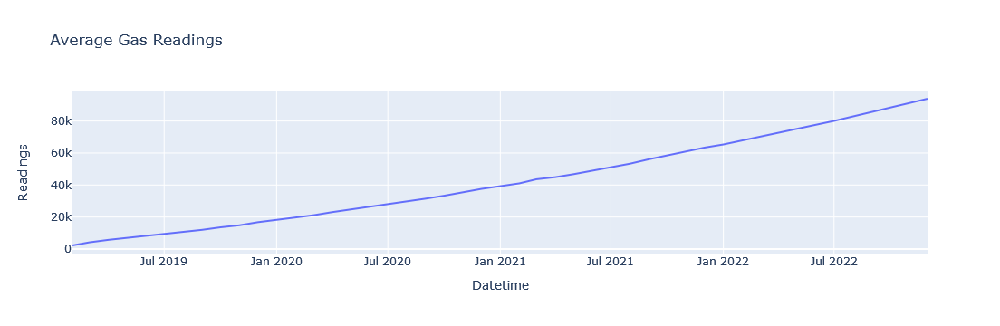

In [47]:
mean_gas = gas_df.groupby(gas_df.index)["cleaned_quantity"].mean()
fig = px.line(
    mean_gas, 
    x=mean_gas.index, 
    y="cleaned_quantity", 
    title="Average Gas Readings", 
    labels={
        "cleaned_quantity": "Readings"
    }
)
fig.show()

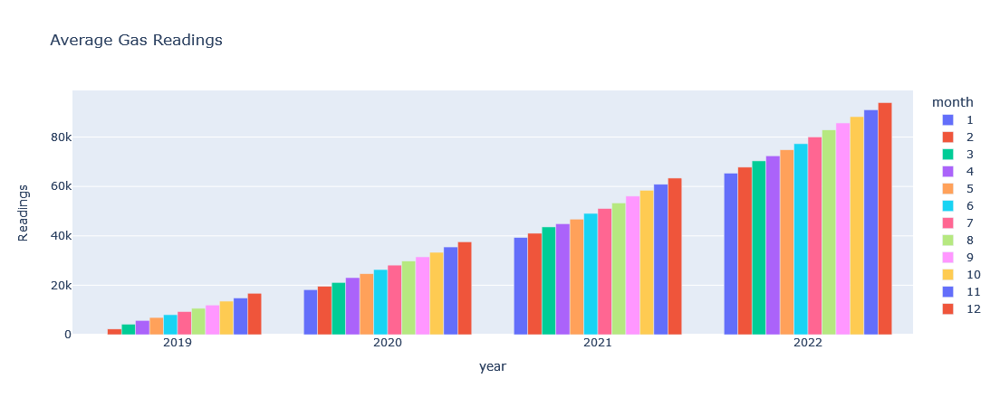

In [48]:
p_table_2 = pd.pivot_table(gas_df, values="cleaned_quantity", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='cleaned_quantity')
fig = px.bar(
    melted_df, 
    x='year', 
    y='cleaned_quantity', 
    color='month', 
    barmode="group",
    height=450,
    title="Average Gas Readings",
    labels={
        "cleaned_quantity":"Readings",
    }
)
fig.show()

In [49]:
# 2019 
consumption_value_1 = melted_df.query("month == 2 and year == 2019")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2019")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2019 Gas consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % ")

#2020
consumption_value_1 = melted_df.query("month == 2 and year == 2020")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2020")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2020 Gas consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % ")

# 2021
consumption_value_1 = melted_df.query("month == 2 and year == 2021")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2021")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2021 Gas consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % ")

#2022
consumption_value_1 = melted_df.query("month == 2 and year == 2022")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2022")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2022 Gas consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % ")

For the year 2019 Gas consumption in February - 2266 and for December - 16758, consumption increased by 639.5410414827891 % 
For the year 2020 Gas consumption in February - 19568 and for December - 37580, consumption increased by 92.04824202780048 % 
For the year 2021 Gas consumption in February - 41037 and for December - 63380, consumption increased by 54.44598776713697 % 
For the year 2022 Gas consumption in February - 67810 and for December - 93924, consumption increased by 38.51054416752691 % 


##### Consumption

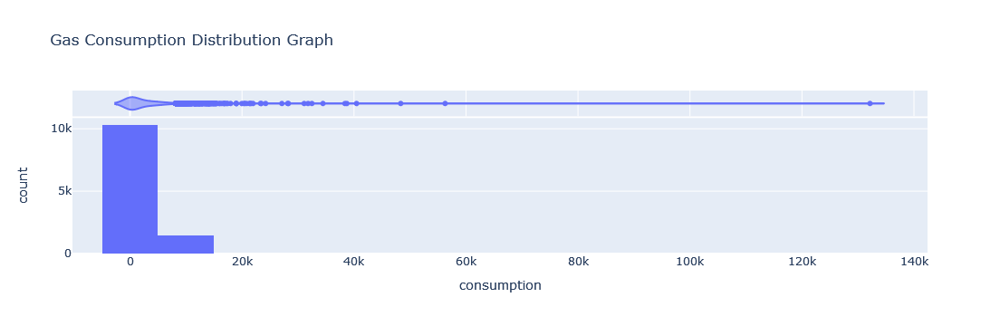

In [50]:
fig = px.histogram(gas_df, 
                   x="consumption", 
                   marginal="violin", 
                   nbins=20, 
                   hover_data=["year", "houseid-meterid"],
                   title="Gas Consumption Distribution Graph"
                  )
fig.show()

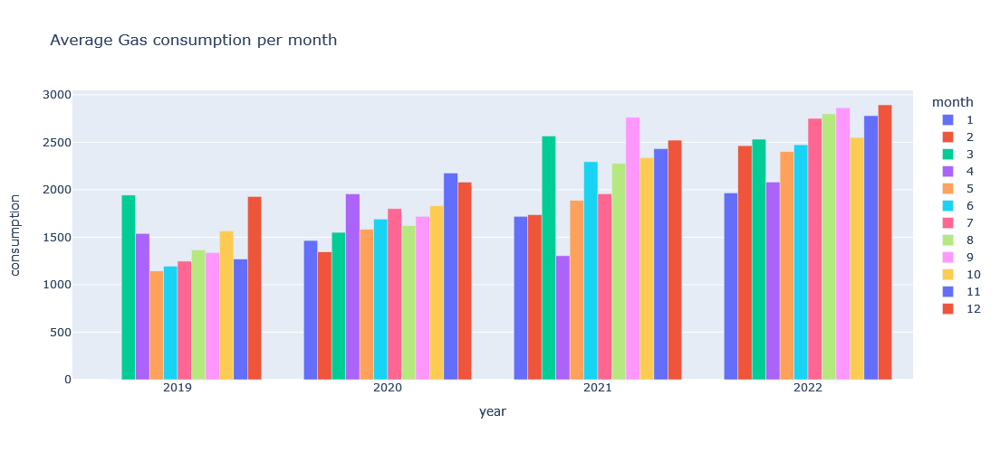

In [51]:
p_table_2 = pd.pivot_table(gas_df, values="consumption", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='consumption')
fig = px.bar(
    melted_df, x='year', y='consumption', 
    color='month', 
    barmode="group", 
    title="Average Gas consumption per month",
    height=500,
)
fig.show()

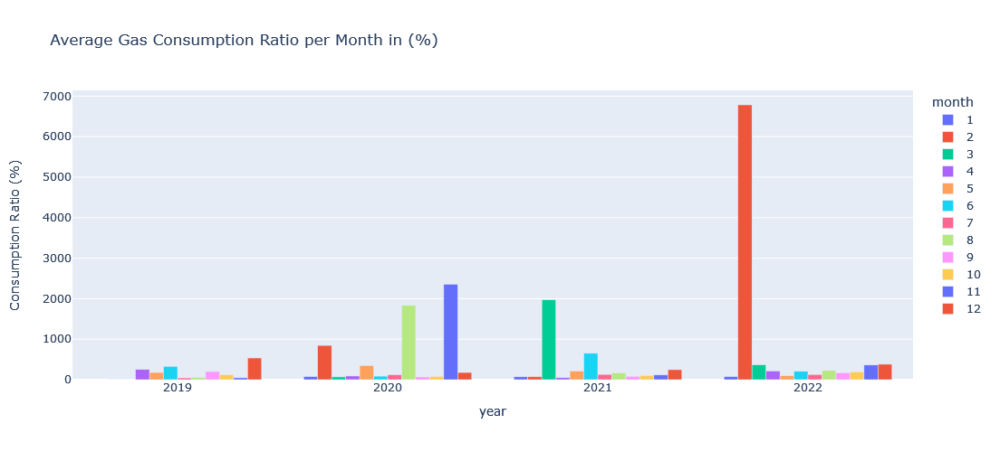

In [52]:
p_table_2 = pd.pivot_table(gas_df, values="consumption-ratio", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='consumption-ratio')
fig = px.bar(melted_df, x='year', 
             y='consumption-ratio', 
             color='month', 
             barmode="group", 
             title="Average Gas Consumption Ratio per Month in (%)", 
             labels={
                 "consumption-ratio": "Consumption Ratio (%)",
             },
             height=500
            )
fig.show()

In [53]:
cons_ratio_2022 = gas_df.query("year == 2022 and `consumption-ratio` > 2000")
cons_ratio_2022.shape[0]

27

__The was large increase in consumption ratio in February why?___

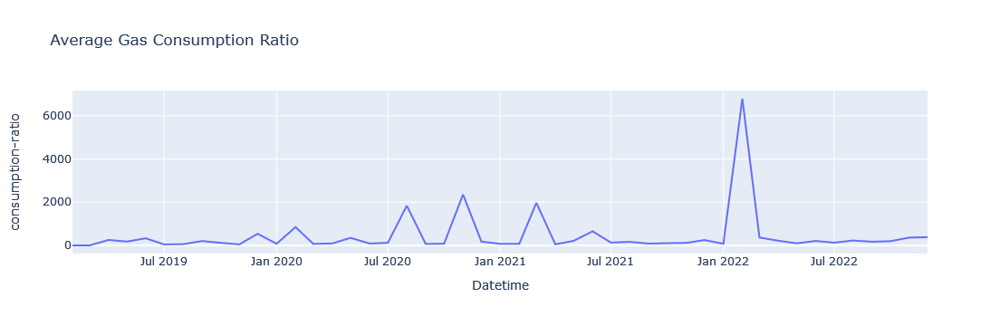

In [54]:
mean_gas = gas_df.groupby(gas_df.index)["consumption-ratio"].mean()
fig = px.line(
    mean_gas, 
    x=mean_gas.index, 
    y="consumption-ratio", 
    title="Average Gas Consumption Ratio", 
    labels={
        "cleaned_quantity": "Readings"
    }
)
fig.show()

#### Electricity

##### Readings

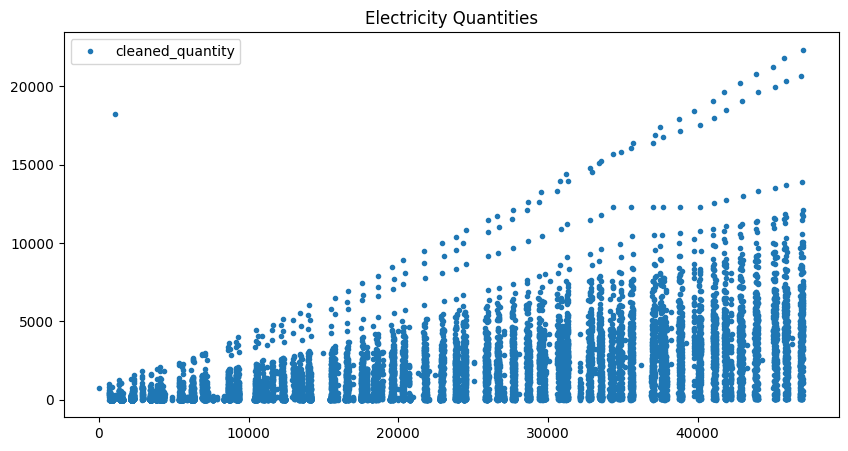

In [55]:
electricity_df.plot(
    y='cleaned_quantity',
    style='.',
        figsize=(10, 5),
        color=color_pal[0],
        title='Electricity Quantities')
plt.show()

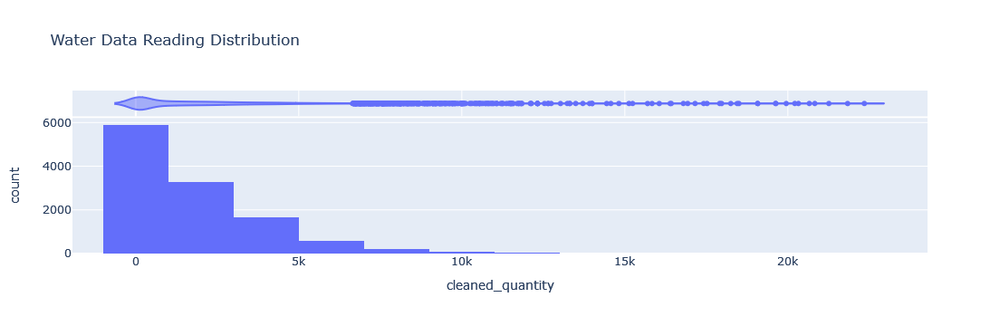

In [56]:
fig = px.histogram(electricity_df, 
                   x="cleaned_quantity", 
                   marginal="violin", 
                   nbins=20, 
                   hover_data=["year"],
                   title="Water Data Reading Distribution"
                  )
fig.show()

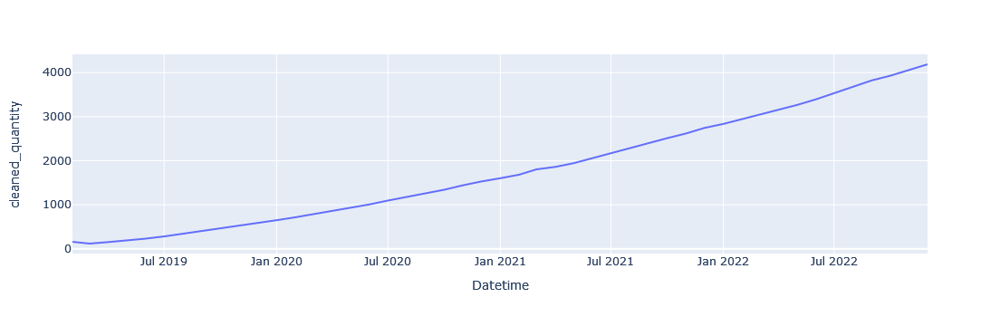

In [57]:
electricity_df.set_index("Datetime", inplace=True)

mean_electricity = electricity_df.groupby(electricity_df.index)["cleaned_quantity"].mean()
fig = px.line(mean_electricity, x=mean_electricity.index, y="cleaned_quantity")
fig.show()

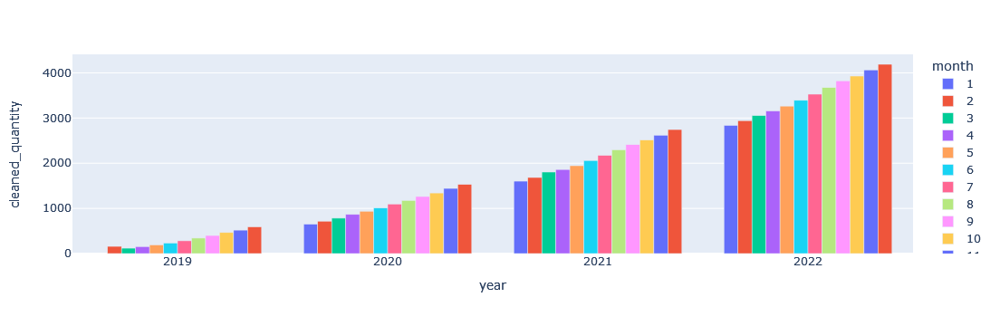

In [58]:
p_table_2 = pd.pivot_table(electricity_df, values="cleaned_quantity", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='cleaned_quantity')
fig = px.bar(melted_df, x='year', y='cleaned_quantity', color='month', barmode="group")
fig.show()

In [59]:
# 2019 
consumption_value_1 = melted_df.query("month == 2 and year == 2019")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2019")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2019 Electricity consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % \n")

#2020
consumption_value_1 = melted_df.query("month == 2 and year == 2020")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2020")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2020 Electricity consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % \n")

# 2021
consumption_value_1 = melted_df.query("month == 2 and year == 2021")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2021")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2021 Electricity consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % \n")

#2022
consumption_value_1 = melted_df.query("month == 2 and year == 2022")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2022")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2022 Electricity consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % \n")

For the year 2019 Electricity consumption in February - 159 and for December - 589, consumption increased by 270.44025157232704 % 

For the year 2020 Electricity consumption in February - 717 and for December - 1529, consumption increased by 113.24965132496514 % 

For the year 2021 Electricity consumption in February - 1684 and for December - 2745, consumption increased by 63.004750593824234 % 

For the year 2022 Electricity consumption in February - 2942 and for December - 4189, consumption increased by 42.38613188307274 % 



##### Consumption

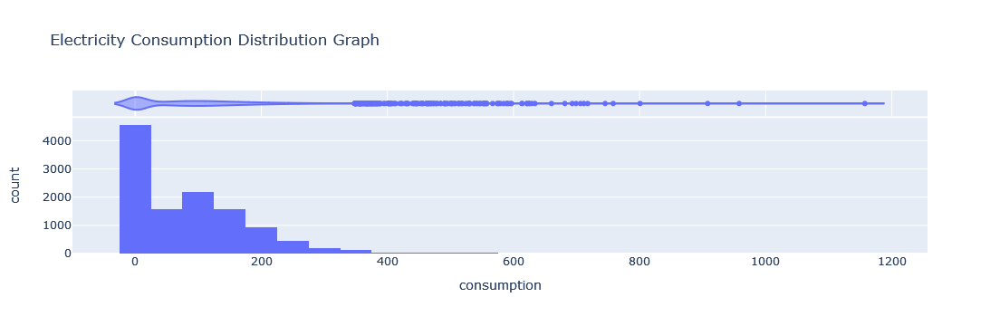

In [60]:
fig = px.histogram(electricity_df, 
                   x="consumption", 
                   marginal="violin", 
                   nbins=40, 
                   hover_data=["year", "houseid-meterid"],
                   title="Electricity Consumption Distribution Graph"
                  )
fig.show()

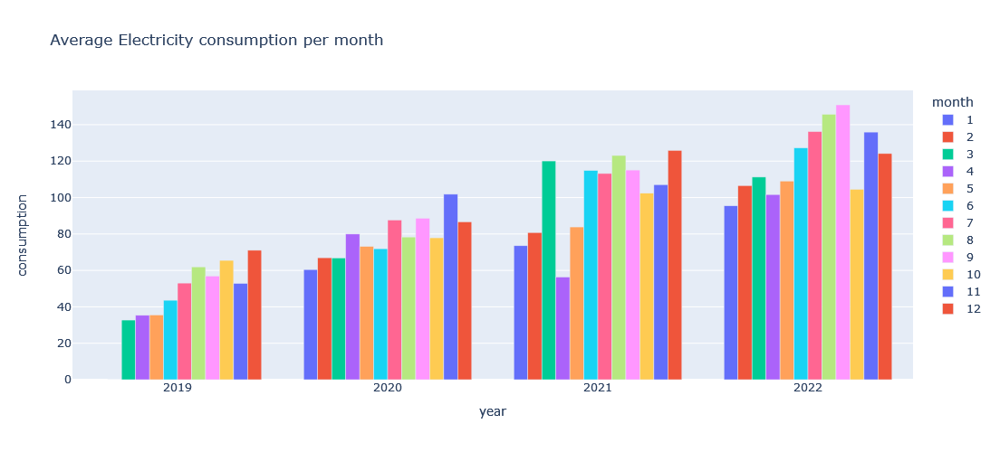

In [61]:
p_table_2 = pd.pivot_table(electricity_df, values="consumption", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='consumption')
fig = px.bar(
    melted_df, x='year', y='consumption', 
    color='month', 
    barmode="group", 
    title="Average Electricity consumption per month",
    height=500,
)
fig.show()

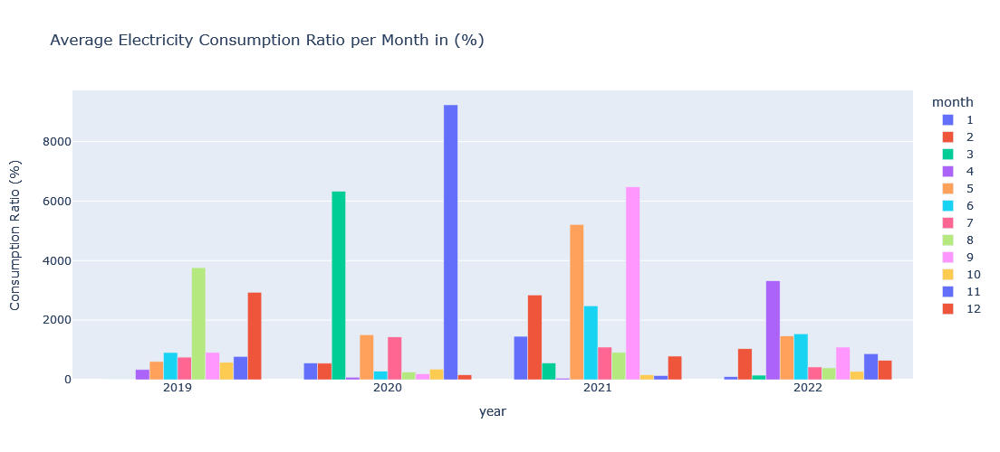

In [62]:
p_table_2 = pd.pivot_table(electricity_df, values="consumption-ratio", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='consumption-ratio')
fig = px.bar(melted_df, x='year', 
             y='consumption-ratio', 
             color='month', 
             barmode="group", 
             title="Average Electricity Consumption Ratio per Month in (%)", 
             labels={
                 "consumption-ratio": "Consumption Ratio (%)",
             },
             height=500
            )
fig.show()

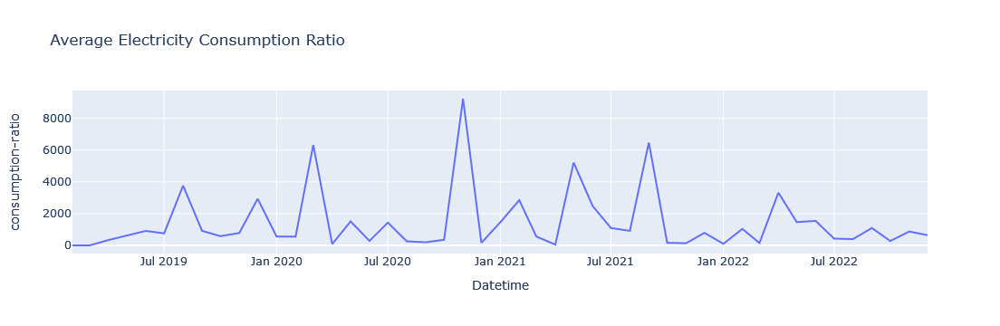

In [63]:
mean_gas = electricity_df.groupby(electricity_df.index)["consumption-ratio"].mean()
fig = px.line(
    mean_gas, 
    x=mean_gas.index, 
    y="consumption-ratio", 
    title="Average Electricity Consumption Ratio", 
    labels={
        "cleaned_quantity": "Readings"
    }
)
fig.show()

#### BackupPower

##### Readings

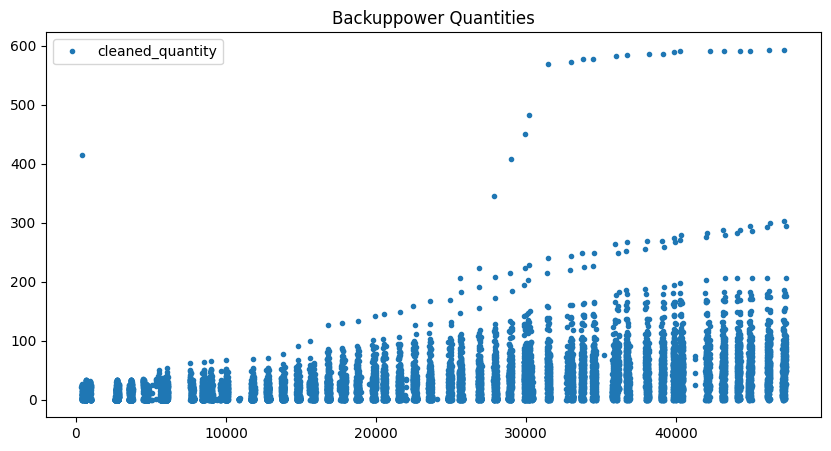

In [64]:
backuppower_df.plot(
    y='cleaned_quantity',
    style='.',
        figsize=(10, 5),
        color=color_pal[0],
        title='Backuppower Quantities')
plt.show()

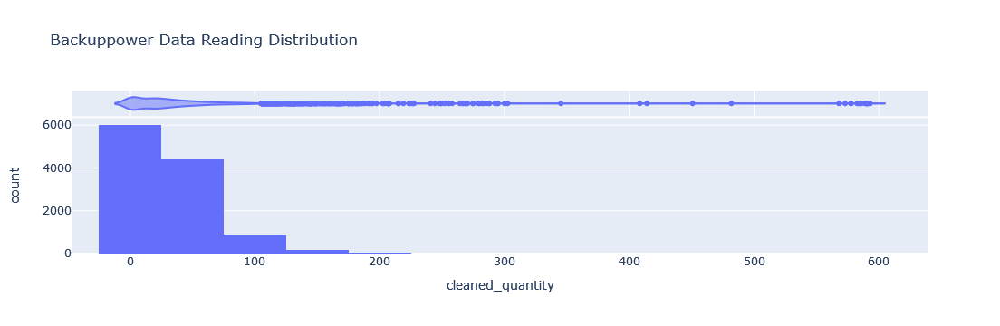

In [65]:
fig = px.histogram(backuppower_df, 
                   x="cleaned_quantity", 
                   marginal="violin", 
                   nbins=20, 
                   hover_data=["year"],
                   title="Backuppower Data Reading Distribution"
                  )
fig.show()

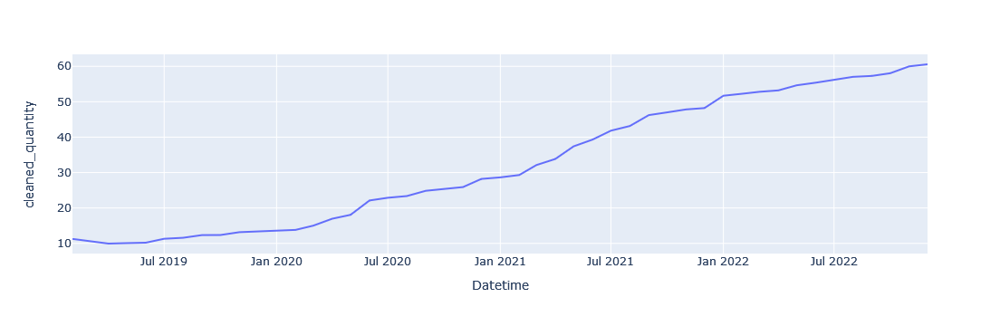

In [66]:
backuppower_df.set_index("Datetime", inplace=True)

mean_backuppower = backuppower_df.groupby(backuppower_df.index)["cleaned_quantity"].mean()
fig = px.line(mean_backuppower, x=mean_backuppower.index, y="cleaned_quantity")
fig.show()

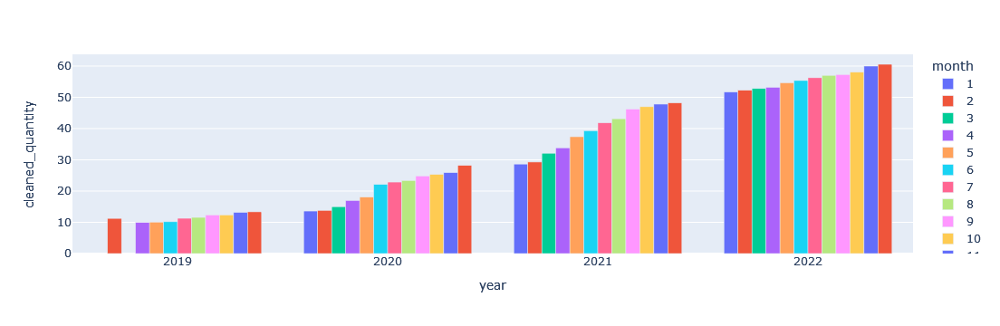

In [67]:
p_table_2 = pd.pivot_table(backuppower_df, values="cleaned_quantity", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='cleaned_quantity')
fig = px.bar(melted_df, x='year', y='cleaned_quantity', color='month', barmode="group")
fig.show()

In [68]:
# 2019 
consumption_value_1 = melted_df.query("month == 2 and year == 2019")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2019")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2019 Backuppower consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % \n")

#2020
consumption_value_1 = melted_df.query("month == 2 and year == 2020")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2020")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2020 Backuppower consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % \n")

# 2021
consumption_value_1 = melted_df.query("month == 2 and year == 2021")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2021")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2021 Backuppower consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % \n")

#2022
consumption_value_1 = melted_df.query("month == 2 and year == 2022")
t = consumption_value_1["cleaned_quantity"]
consumption_value_2 = melted_df.query("month == 12 and year == 2022")
p = consumption_value_2['cleaned_quantity']
num = int(p)
den = int(t)
print(f"For the year 2022 Backuppower consumption in February - {den} and for December - {num}, consumption increased by {abs((den-num))/den * 100} % \n")


For the year 2019 Backuppower consumption in February - 11 and for December - 13, consumption increased by 18.181818181818183 % 

For the year 2020 Backuppower consumption in February - 13 and for December - 28, consumption increased by 115.38461538461537 % 

For the year 2021 Backuppower consumption in February - 29 and for December - 48, consumption increased by 65.51724137931035 % 

For the year 2022 Backuppower consumption in February - 52 and for December - 60, consumption increased by 15.384615384615385 % 



##### Consumption

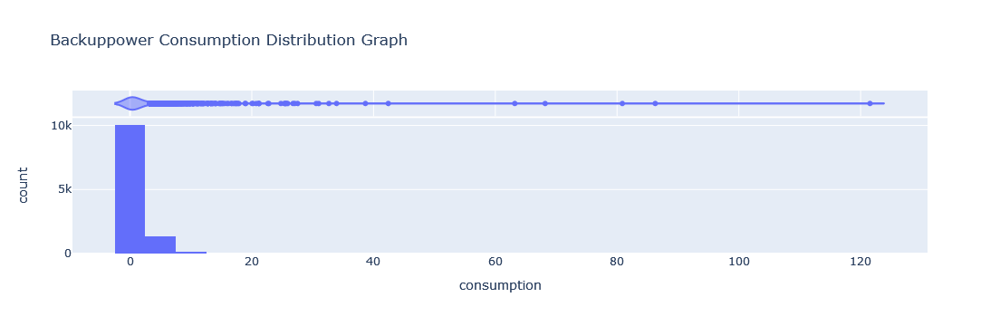

In [69]:
fig = px.histogram(backuppower_df, 
                   x="consumption", 
                   marginal="violin", 
                   nbins=40, 
                   hover_data=["year", "houseid-meterid"],
                   title="Backuppower Consumption Distribution Graph"
                  )
fig.show()

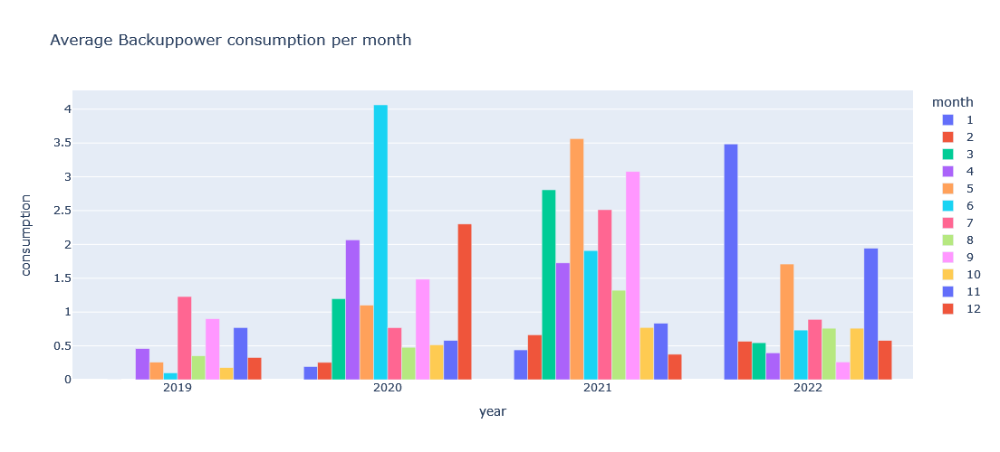

In [70]:
p_table_2 = pd.pivot_table(backuppower_df, values="consumption", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='consumption')
fig = px.bar(
    melted_df, x='year', y='consumption', 
    color='month', 
    barmode="group", 
    title="Average Backuppower consumption per month",
    height=500,
)
fig.show()

In [71]:
backuppower_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11582 entries, 2019-02-01 to 2022-12-01
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      11582 non-null  int64  
 1   paymenttermid           11582 non-null  object 
 2   houseid                 11582 non-null  int64  
 3   houseid-meterid         11582 non-null  object 
 4   quantity                11582 non-null  float64
 5   month                   11582 non-null  int64  
 6   year                    11582 non-null  int64  
 7   cleaned_quantity        11582 non-null  float64
 8   consumption             11582 non-null  float64
 9   prev-month-consumption  11582 non-null  float64
 10  consumption-ratio       11582 non-null  float64
dtypes: float64(5), int64(4), object(2)
memory usage: 1.1+ MB


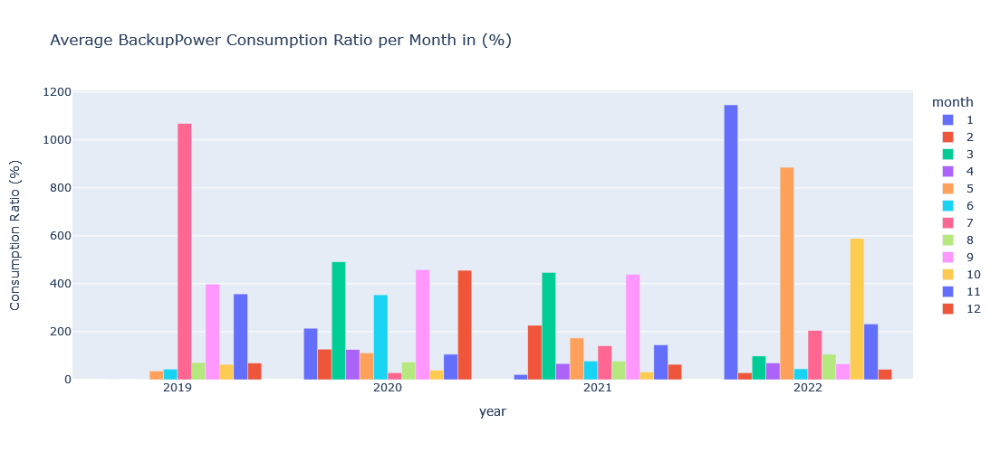

In [72]:
p_table_2 = pd.pivot_table(backuppower_df, values="consumption-ratio", columns="month", aggfunc="mean", index="year")
melted_df = p_table_2.reset_index().melt(id_vars=['year'], var_name='month', value_name='consumption-ratio')
fig = px.bar(melted_df, x='year', 
             y='consumption-ratio', 
             color='month', 
             barmode="group", 
             title="Average BackupPower Consumption Ratio per Month in (%)", 
             labels={
                 "consumption-ratio": "Consumption Ratio (%)",
             },
             height=500
            )
fig.show()

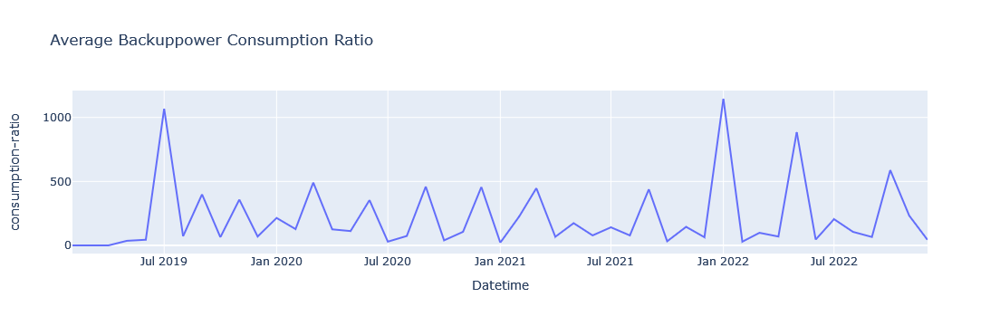

In [73]:
mean_gas = backuppower_df.groupby(backuppower_df.index)["consumption-ratio"].mean()
fig = px.line(
    mean_gas, 
    x=mean_gas.index, 
    y="consumption-ratio", 
    title="Average Backuppower Consumption Ratio", 
    labels={
        "cleaned_quantity": "Readings"
    }
)
fig.show()

## Machine Learning

In [74]:
from sklearn.model_selection import TimeSeriesSplit

In [75]:
zero_water = water_df[(water_df["consumption"] == 0) & (water_df["year"] == 2019)]
print(f"There water dataset has {zero_water.shape[0]} rows with 0 as the consumption")
# water_df = water[water_df["consumption"] > 0]
zero_electricity = electricity_df[(electricity_df["consumption"] == 0) & (electricity_df["year"] == 2019)]
print(f"The electricity dataset has {zero_electricity.shape[0]} rows with 0 as the consumption")

zero_gas = gas_df[(gas_df["consumption"] == 0) & (gas_df["year"] == 2019)]
print(f"The gas dataset has {zero_gas.shape[0]} rows with 0 as the consumption")

zero_backuppower = backuppower_df[(backuppower_df["consumption"] == 0) & (backuppower_df["year"] == 2019)]
print(f"The backuppower dataset has {zero_backuppower.shape[0]} rows with 0 as the consumption")

There water dataset has 1358 rows with 0 as the consumption
The electricity dataset has 709 rows with 0 as the consumption
The gas dataset has 1733 rows with 0 as the consumption
The backuppower dataset has 1274 rows with 0 as the consumption


In [76]:
water_df = water_df[(water_df["month"] != 2) & (water_df["year"] != 2019)]
gas_df = gas_df[(gas_df["month"] != 2) & (gas_df["year"] != 2019)]
electricity_df = electricity_df[(electricity_df["month"] != 2) & (electricity_df["year"] != 2019)]
backuppower_df = backuppower_df[(backuppower_df["month"] != 2) & (backuppower_df["year"] != 2019)]

### Train-Test Split

In [77]:
print(f"The water data has {water_df.shape[0]} rows \n")
print(f"The backup power data has {backuppower_df.shape[0]} rows \n")
print(f"The electricity data has {electricity_df.shape[0]} rows \n")
print(f"The gas data has {gas_df.shape[0]} rows \n")

The water data has 8052 rows 

The backup power data has 8315 rows 

The electricity data has 8282 rows 

The gas data has 8316 rows 



In [79]:
water_df = water_df[["month", "year", "prev-month-consumption", "consumption"]]
backuppower_df = backuppower_df[["month", "year", "prev-month-consumption", "consumption"]]
electricity_df = electricity_df[["month", "year", "prev-month-consumption", "consumption"]]
gas_df = gas_df[["month", "year", "prev-month-consumption", "consumption"]]

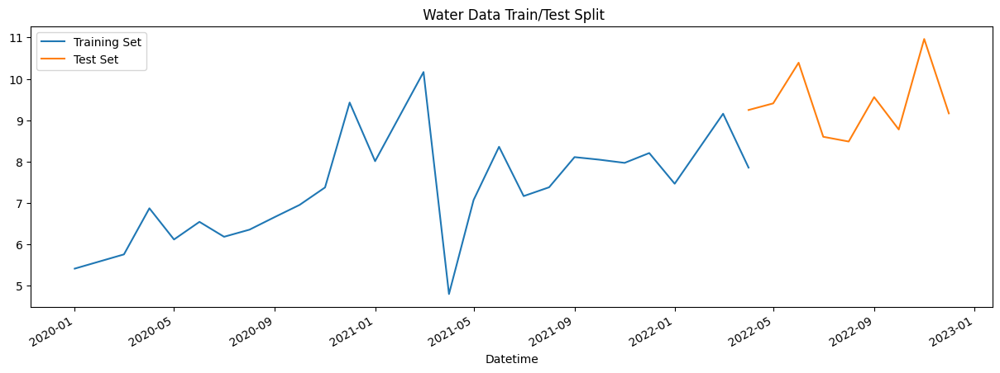

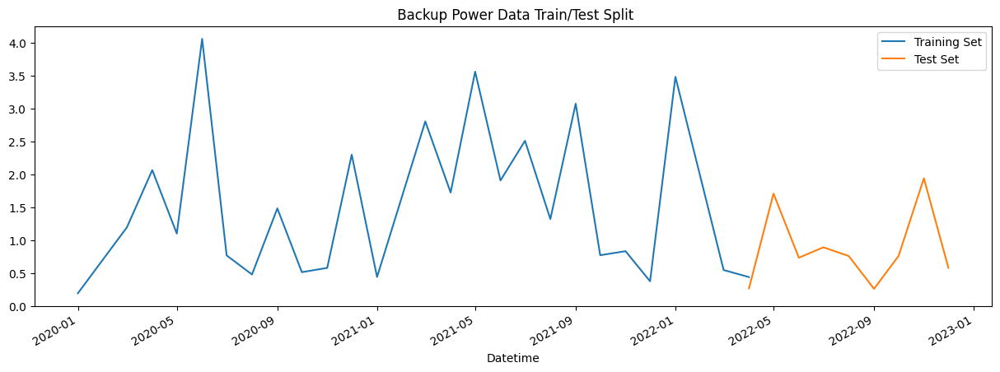

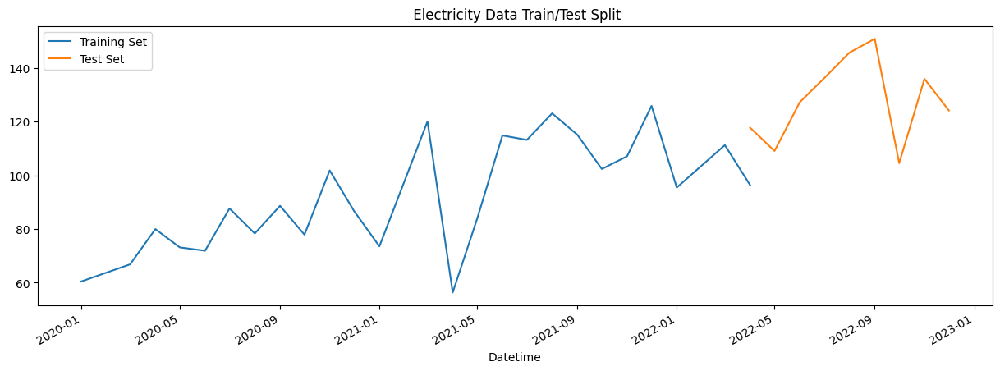

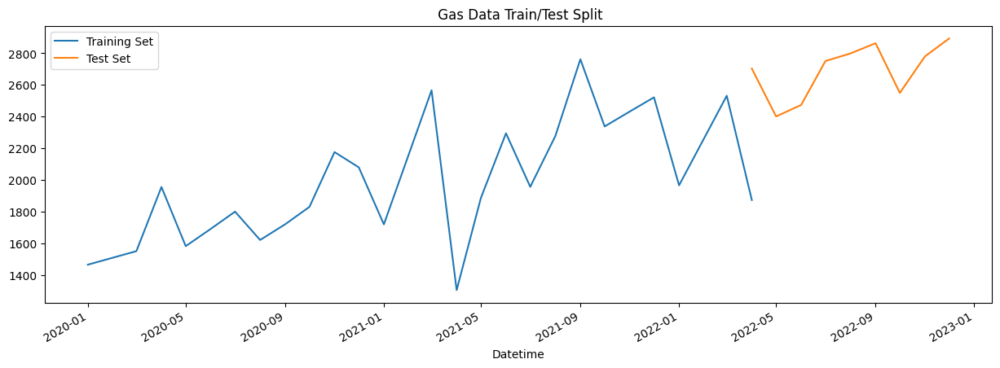

In [80]:
tss = TimeSeriesSplit(n_splits=3)

# train-test split for the water data
X_water = water_df.drop(labels=['consumption'], axis=1)
y_water = water_df['consumption']

for train_index, test_index in tss.split(X_water):
    X_water_train, X_water_test = X_water.iloc[train_index,:], X_water.iloc[test_index,:]
    y_water_train, y_water_test = y_water.iloc[train_index], y_water.iloc[test_index]

fig, ax = plt.subplots(figsize=(15, 5))
y_water_train.groupby('Datetime').mean().plot(ax=ax, label="Training Set", title=" Water Data Train/Test Split")
y_water_test.groupby('Datetime').mean().plot(ax=ax, label="Test Set")
                                              
ax.legend(['Training Set', 'Test Set'])
plt.show()

# train-test split for backup power data
X_backuppower = backuppower_df.drop(labels=['consumption'], axis=1)
y_backuppower = backuppower_df['consumption']

for train_index, test_index in tss.split(X_backuppower):
    X_backuppower_train, X_backuppower_test = X_backuppower.iloc[train_index,:], X_backuppower.iloc[test_index,:]
    y_backuppower_train, y_backuppower_test = y_backuppower.iloc[train_index], y_backuppower.iloc[test_index]

fig, ax = plt.subplots(figsize=(15, 5))
y_backuppower_train.groupby('Datetime').mean().plot(ax=ax, label="Training Set", title=" Backup Power Data Train/Test Split")
y_backuppower_test.groupby('Datetime').mean().plot(ax=ax, label="Test Set")
                                              
ax.legend(['Training Set', 'Test Set'])
plt.show()

X_electricity = electricity_df.drop(labels=['consumption'], axis=1)
y_electricity = electricity_df['consumption']

for train_index, test_index in tss.split(X_electricity):
    X_electricity_train, X_electricity_test = X_electricity.iloc[train_index,:], X_electricity.iloc[test_index,:]
    y_electricity_train, y_electricity_test = y_electricity.iloc[train_index], y_electricity.iloc[test_index]

fig, ax = plt.subplots(figsize=(15, 5))
y_electricity_train.groupby('Datetime').mean().plot(ax=ax, label="Training Set", title=" Electricity Data Train/Test Split")
y_electricity_test.groupby('Datetime').mean().plot(ax=ax, label="Test Set")
                                              
ax.legend(['Training Set', 'Test Set'])
plt.show()

X_gas = gas_df.drop(labels=['consumption'], axis=1)
y_gas = gas_df['consumption']

for train_index, test_index in tss.split(X_gas):
    X_gas_train, X_gas_test = X_gas.iloc[train_index,:], X_gas.iloc[test_index,:]
    y_gas_train, y_gas_test = y_gas.iloc[train_index], y_gas.iloc[test_index]

fig, ax = plt.subplots(figsize=(15, 5))
y_gas_train.groupby('Datetime').mean().plot(ax=ax, label="Training Set", title=" Gas Data Train/Test Split")
y_gas_test.groupby('Datetime').mean().plot(ax=ax, label="Test Set")
                                              
ax.legend(['Training Set', 'Test Set'])
plt.show()



#### Predictive Modelling

In [81]:
gas_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8316 entries, 2020-01-01 to 2022-12-01
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   month                   8316 non-null   int64  
 1   year                    8316 non-null   int64  
 2   prev-month-consumption  8316 non-null   float64
 3   consumption             8316 non-null   float64
dtypes: float64(2), int64(2)
memory usage: 324.8 KB


In [82]:
electricity_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8282 entries, 2020-01-01 to 2022-12-01
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   month                   8282 non-null   int64  
 1   year                    8282 non-null   int64  
 2   prev-month-consumption  8282 non-null   float64
 3   consumption             8282 non-null   float64
dtypes: float64(2), int64(2)
memory usage: 323.5 KB


#### Forecast Modelling

In [90]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

In [91]:
def monthlyaggregation(df):
    df = df.reset_index()
    grouped_data = df.groupby("Datetime")
    result = grouped_data.mean()
    result = result.reset_index()
    final = result[["Datetime", "consumption"]]
    final = final.rename(columns={'Datetime': 'ds', 'consumption': 'y'})
    return final

In [92]:
gas_proph_data = monthlyaggregation(gas_df)
backuppower_proph_data = monthlyaggregation(backuppower_df)
electricity_proph_data = monthlyaggregation(electricity_df)
water_proph_data = monthlyaggregation(water_df)

In [169]:
gas_proph_data.head(20)

,ds,y,cap,floor
0,2020-01-01,1465.750000,4000,1000
1,2020-03-01,1551.146825,4000,1000
2,2020-04-01,1956.218254,4000,1000
3,2020-05-01,1582.734127,4000,1000
4,2020-06-01,1691.873016,4000,1000
5,2020-07-01,1800.527778,4000,1000
6,2020-08-01,1621.551587,4000,1000
7,2020-09-01,1720.869048,4000,1000
8,2020-10-01,1830.690476,4000,1000
9,2020-11-01,2176.559524,4000,1000


##### Water

In [142]:
water_proph_data['cap'] = 16
water_proph_data['floor'] = 5

In [167]:
water_proph_data.describe()

,y,cap,floor
count,33.000000,33.0,33.0
mean,7.849851,16.0,5.0
std,1.473866,0.0,0.0
min,4.795082,16.0,5.0
25%,6.868852,16.0,5.0
50%,8.008197,16.0,5.0
75%,8.774590,16.0,5.0
max,10.963115,16.0,5.0


In [143]:
water_m = Prophet(growth='logistic')
water_m.fit(water_proph_data)

06:42:42 - cmdstanpy - INFO - Chain [1] start processing
06:42:42 - cmdstanpy - INFO - Chain [1] done processing


In [144]:
water_future = water_m.make_future_dataframe(periods=6, freq='MS' )

In [145]:
water_future['cap'] = 16
water_future['floor'] = 5

In [146]:
water_forecast = water_m.predict(water_future)

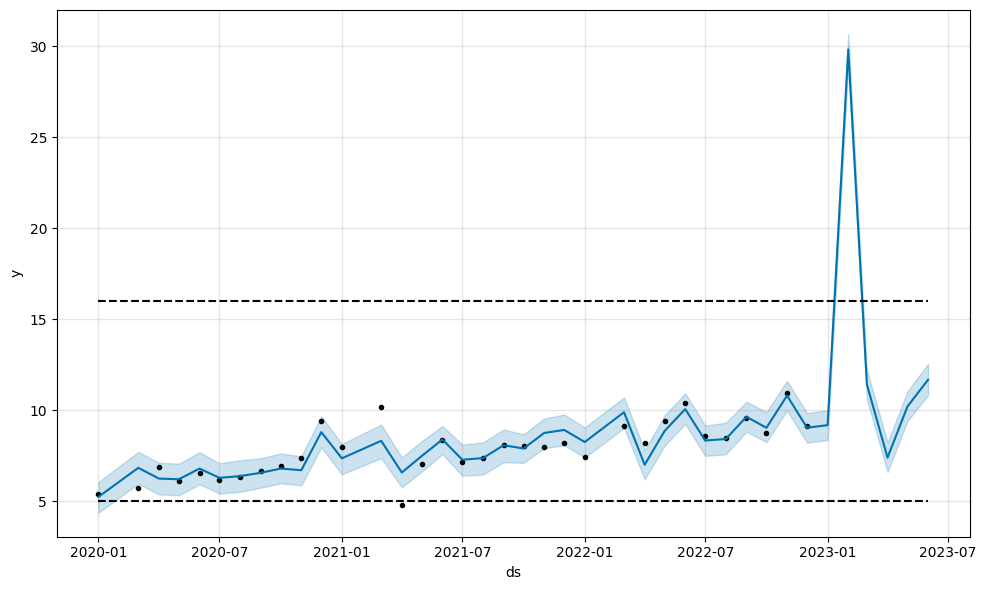

In [147]:
fig1 = water_m.plot(water_forecast)

__The large deficit in February may be caused by?__
* Large 0 values in early February 2019?

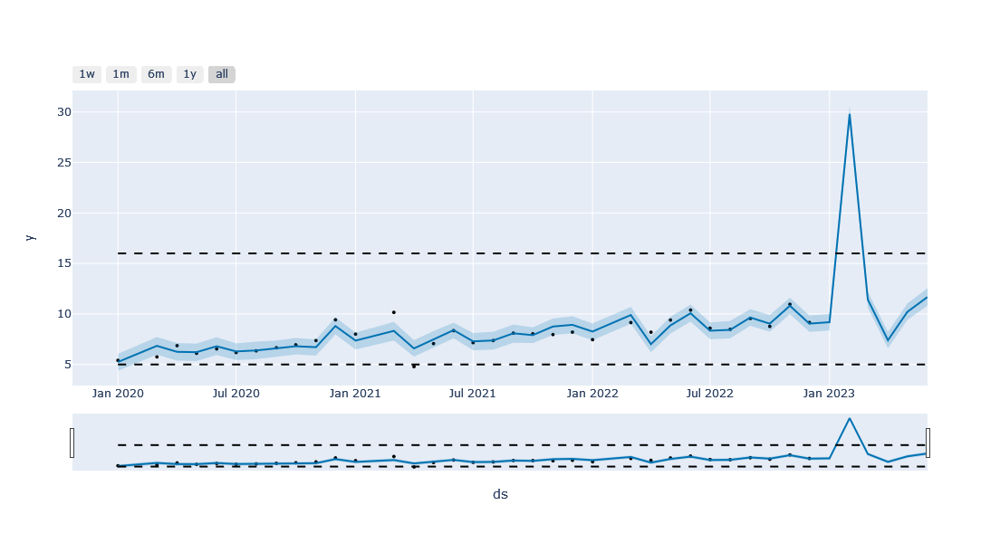

In [148]:
plot_plotly(water_m, water_forecast)

##### Gas 

In [121]:
gas_proph_data['cap'] = 4000
gas_proph_data['floor'] = 1000

In [122]:
gas_m = Prophet(growth='logistic')
gas_m.fit(gas_proph_data)

06:01:46 - cmdstanpy - INFO - Chain [1] start processing
06:01:46 - cmdstanpy - INFO - Chain [1] done processing


In [123]:
gas_future = gas_m.make_future_dataframe(periods=6, freq='MS')
gas_future['cap'] = 4000
gas_future['floor'] = 1000

In [124]:
gas_forecast = gas_m.predict(gas_future)

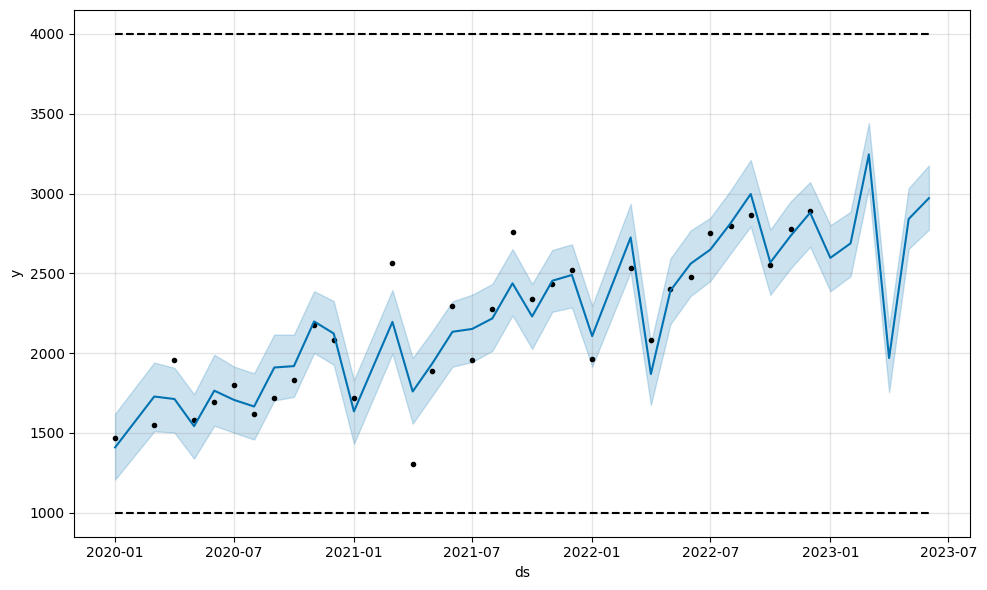

In [125]:
fig1 = gas_m.plot(gas_forecast)

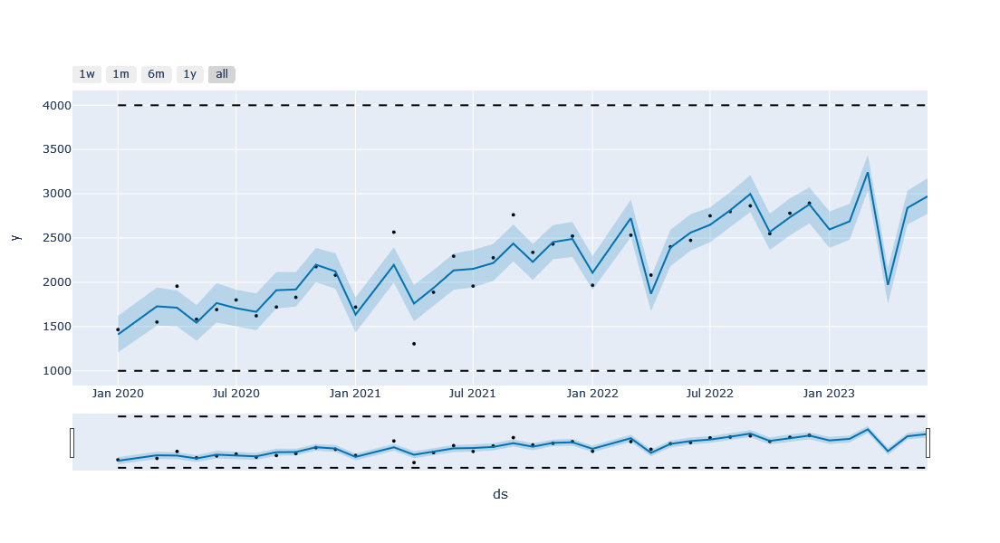

In [126]:
plot_plotly(gas_m, gas_forecast)

##### Electricity

In [156]:
electricity_proph_data['cap'] = 175
electricity_proph_data['floor'] = 50

In [157]:
# gas_m = Prophet(growth='logistic')
electricity_m = Prophet(growth='logistic')
electricity_m.fit(electricity_proph_data)

06:53:19 - cmdstanpy - INFO - Chain [1] start processing
06:53:20 - cmdstanpy - INFO - Chain [1] done processing


In [161]:
electricity_future = electricity_m.make_future_dataframe(periods=6, freq='MS')
electricity_future['cap'] = 175
electricity_future['floor'] = 50

In [162]:
electricity_forecast = electricity_m.predict(electricity_future)

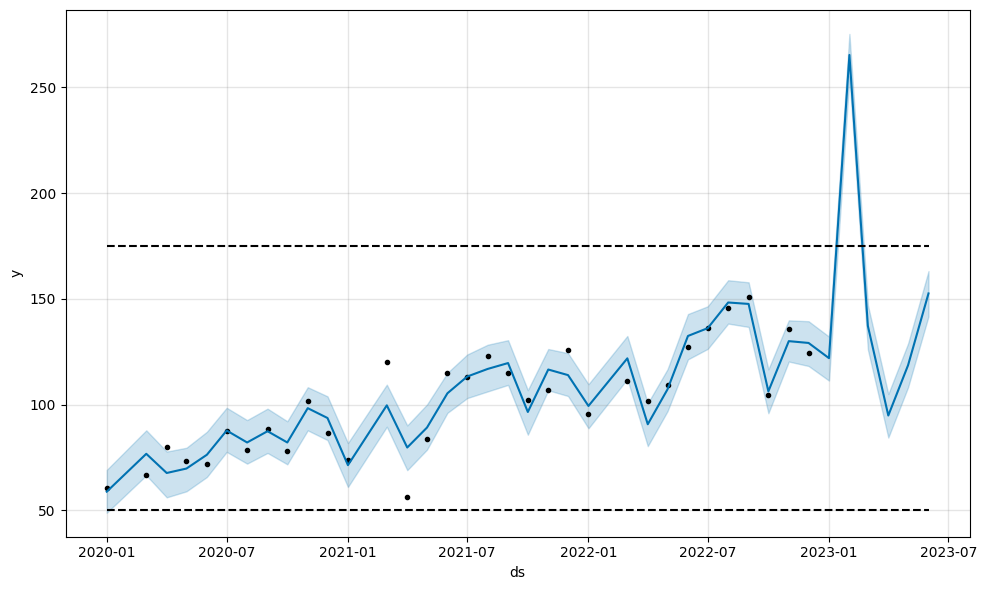

In [163]:
fig1 = electricity_m.plot(electricity_forecast)

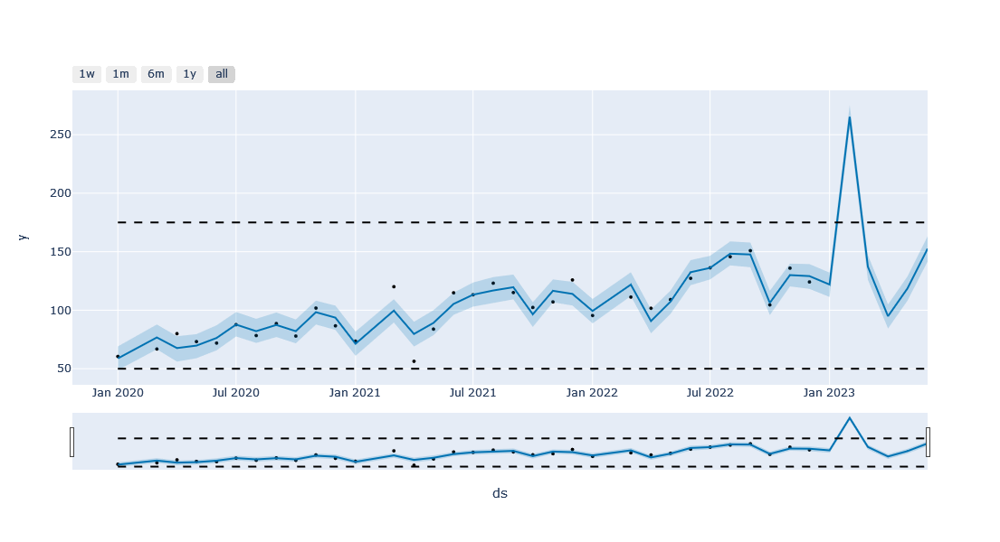

In [165]:
plot_plotly(electricity_m, electricity_forecast)

##### Backup Power